<a href="https://colab.research.google.com/github/maggiemcc02/honours_results/blob/main/DustingOff_2DMPIter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction
Here, I dust off and reconfigure my 2D codes from the summer. In particular, I set up the 2D MP Iteration using either a Bahkvalov or Gradient Based M.



March 2025


# Background
The work in this notebook is based on the following derivations/notes:

## Physical solve

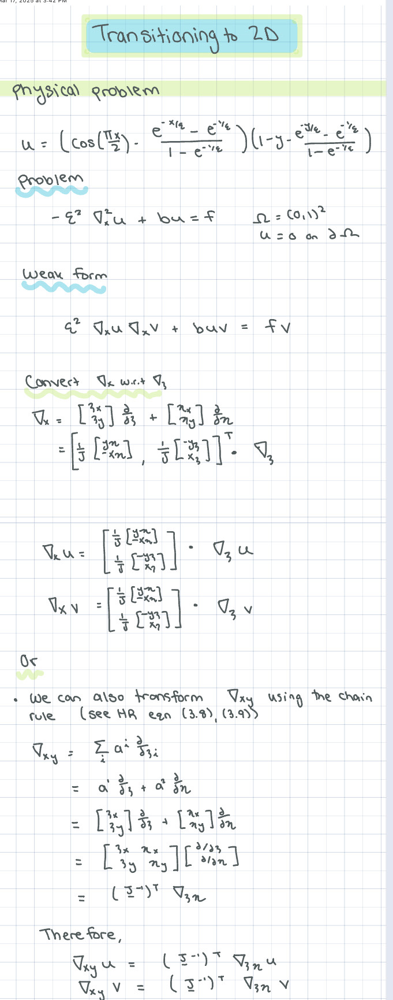

## Mesh Solve
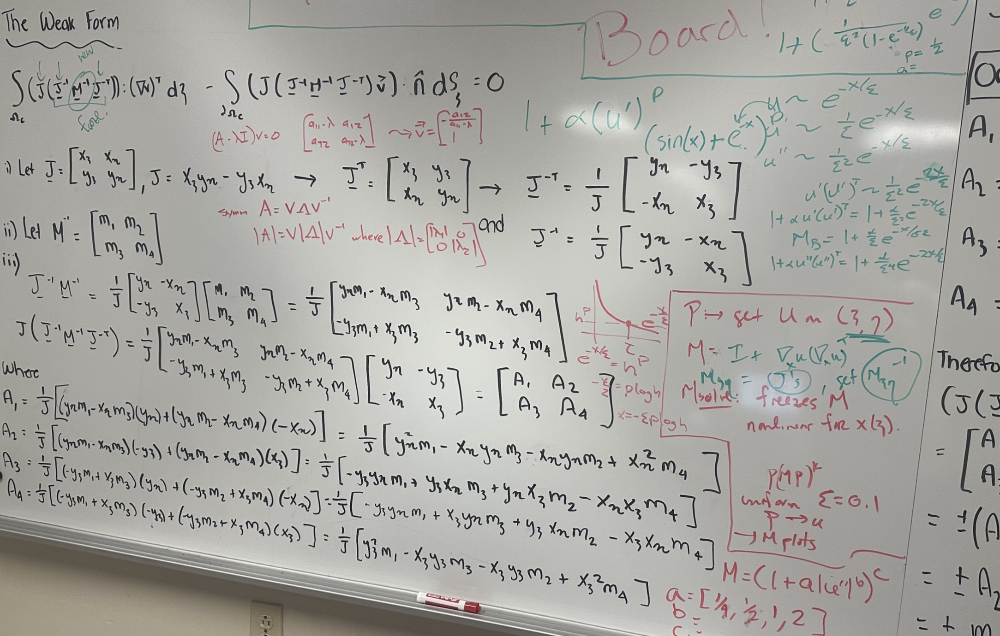

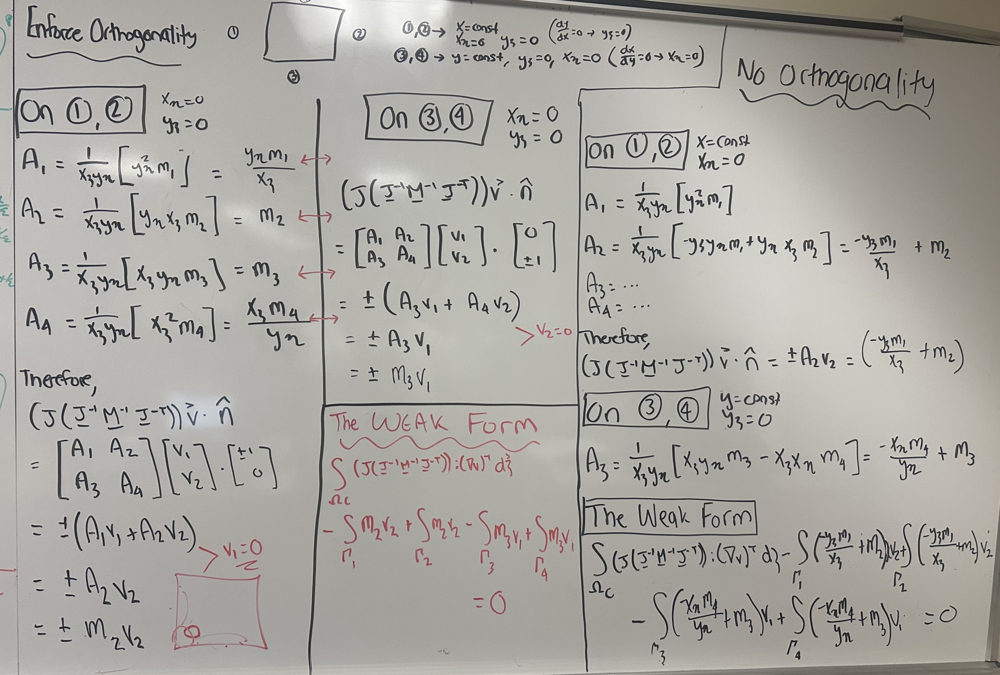

## 1D MP Iteration (Our Guide)

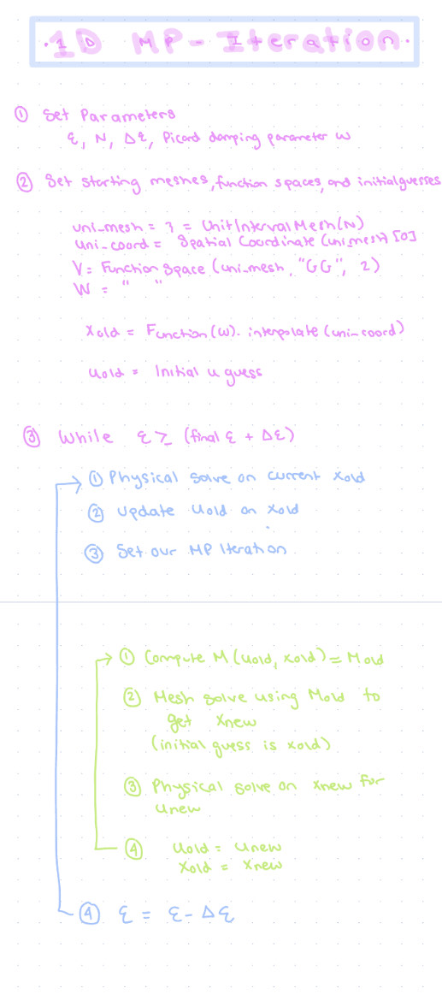

# Imports

In [11]:
# install firedrake

# hide output
%%capture

# try:
#     import firedrake
# except ImportError:
#     !wget "https://fem-on-colab.github.io/releases/firedrake-install-real.sh" -O "/tmp/firedrake-install.sh" && bash "/tmp/firedrake-install.sh"
#     import firedrake


try:
    from firedrake import *
except ImportError:
    !wget "https://fem-on-colab.github.io/releases/firedrake-install-release-real.sh" -O "/tmp/firedrake-install.sh" && bash "/tmp/firedrake-install.sh"
    from firedrake import *

In [ ]:
# Code in this cell makes plots appear an appropriate size and resolution in the browser window

%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (11, 6)

In [ ]:
# import firedrake tools

from firedrake import *
import numpy as np
import matplotlib.pyplot as plt # firedrake makes use of matplotlib tools
from firedrake.pyplot import tripcolor, tricontour, triplot #firedrake plotting
from IPython.display import display
from mpl_toolkits import mplot3d



# The Known Solution

In [ ]:
def known_solution(x, epsilon):


  eps = Constant(epsilon)

  parta = cos((pi/2)*x[0]) - ( exp(-x[0]/eps) - exp(-1/eps) ) / ( 1 - exp(-1/eps) )
  partb = 1 - x[1] - ( exp(-x[1]/eps) - exp(-1/eps) ) / ( 1 - exp(-1/eps) )
  u_exact = parta*partb


  return u_exact

# Physical Solver



In [ ]:

# phyiscal solver

def physical_solver(mesh, x, V, known_solution, epsilon = 0.1, plots = True, Bak_M = False, Grad_M = True):

  # test and trial functions (cause a linear physical problem)

  u_hat = TrialFunction(V)
  v_hat = TestFunction(V)

  # set f (rhs of pde)


  eps = Constant(epsilon)

  # f_hat = -eps**2*((-pi**2*cos(pi*x[0]/2)/4 - exp(-x[0]/eps)/(eps**2*(1 - exp(-1/eps))))*(-x[1] + 1 - (exp(-x[1]/eps) - exp(-1/eps))/(1 - exp(-1/eps))) - (cos(pi*x[0]/2) - (exp(-x[0]/eps) - exp(-1/eps))/(1 - exp(-1/eps)))*exp(-x[1]/eps)/(eps**2*(1 - exp(-1/eps)))) + (cos(pi*x[0]/2) - (exp(-x[0]/eps) - exp(-1/eps))/(1 - exp(-1/eps)))*(-x[1] + 1 - (exp(-x[1]/eps) - exp(-1/eps))/(1 - exp(-1/eps)))


  # The jacobian matrix of the mesh solution x

  J_F = grad(x) # jacobian matrix


  #pull components out
  x_xi = J_F[0,0]
  x_eta = J_F[0,1]
  y_xi = J_F[1,0]
  y_eta = J_F[1,1]

  # determinant
  det_J = x_xi * y_eta - x_eta * y_xi


  # inverse of the jacobian

  J_F_inv = inv(J_F)
  J_F_inv_T = transpose(J_F_inv)

  # Compute the rhs of the PDE

  a1 = (1/det_J) * as_vector([y_eta, -x_eta]) # HR (3.28)
  a2 = (1/det_J) * as_vector([-y_xi, x_xi]) # HR (3.29)

  grad_xi_sol = grad( known_solution(x, epsilon) )
  grad_x_sol = dot(J_F_inv_T, grad_xi_sol) # Based on HR (3.8) # transform gradient

  val1 = inner( det_J * a1 , grad_x_sol ) # Based on HR (3.9) # transform divergence
  val2 = inner( det_J * a2 , grad_x_sol ) # Based on HR (3.9)

  div_term = (1/det_J) * div( as_vector([val1, val2]) ) # the transformed divergence

  f_hat = -eps**2 * div_term + known_solution(x, epsilon) # the rhs of the pde


  # compute grad_(x) of u (HR 3.8)

  grad_x_u = dot(J_F_inv_T, grad(u_hat))


  # compute grad_(x) of v (HR 3.8)

  grad_x_v = dot(J_F_inv_T, grad(v_hat))


  # The bilinear lhs

  a = ( (eps**2) * inner( grad_x_u, grad_x_v) + inner(u_hat, v_hat) ) * det_J * dx

  # The linear rhs

  L = (inner( f_hat, v_hat ) * det_J) * dx



  # define the BC's


  bcs = DirichletBC(V, known_solution(x, epsilon), "on_boundary" )


  # solve the problem

  sol = Function(V)


  solve(a == L, sol, bcs = bcs)


  # exact solution

  exact_sol = known_solution(x, epsilon)


  # L2 error

  phys_error_1 = norm( sqrt(det_J) * (exact_sol - sol) )
  phys_error_2 = norm(  sqrt(epsilon) * sqrt(det_J) * dot(J_F_inv_T , grad(exact_sol - sol)) )





  if Bak_M:
    # Bakhvalov Mesh Density Matrix

    K0 = 0.4 # weight of points in layers
    K1 = 0.4
    rho = 0.99  # c >= rho^2
    sigma = 2.5  # sigma > order of FEM + 1

    Mt1 = K0 * rho * (1/eps) * ( exp( (-rho*x[0]) / (sigma*eps) ) )
    Mt2 = K1 * rho * (1/eps) * ( exp( (-rho*x[1]) / (sigma*eps) ) )

    m0 = 1 + Mt1
    m1 = 1 + Mt2

    M = as_matrix([[m0, 0], [0, m1]])



  if Grad_M:

    grad_u = dot(J_F_inv_T, grad(sol))
    alpha = 0.1

    M = Identity(2) + alpha * outer(grad_u, grad_u)



  # if Grad_M: # Based on HR (5.191)

  #   # Define M

  #   alpha_hat = Constant(1)

  #   grad_xi_sol = dot(J_F_inv_T, grad(sol))


  #   alpha_a = assemble(alpha_hat**2 * ( ((sol)**2)* det_J * dx ))

  #   alpha_b = assemble( ( inner( grad_xi_sol, grad_xi_sol)**(1/4) ) * det_J * dx )**4

  #   alpha = max(alpha_a , alpha_b)

  #   M_a = ( 1 + (1/(alpha)) * inner(grad_xi_sol, grad_xi_sol) )**(-1/4)

  #   M_b = ( Identity(2) + (1/alpha) * outer( grad_xi_sol, grad_xi_sol ) )

  #   M = M_a * M_b

  #   if alpha == alpha_a :
  #     print('Used term 1 for alpha')
  #     print('alpha = ', alpha)
  #     print()

  #   if alpha == alpha_b:
  #     print('Used term 2 for alpha')
  #     print('alpha = ', alpha)
  #     print()



  # return the solution and the mesh density function


  return sol, M, phys_error_1, phys_error_2

# Mesh Solver

In [ ]:
# mesh solver


def mesh_solver_noJ(xi, eta, M_matrix, x, W, deg = 1, rtol = 1e-8, stol = 1e-8, atol = 1e-50, maxit = 10, scale_BI = False):

  # WINSLOW BASED ON (6.131) in HR




  # function to hold mesh solution
  mesh_sol = Function(W)

  # Jacobian

  J_matrix = grad(mesh_sol)
  detJ = det(J_matrix)

  # JMJ part

  # The transformed nonlinear problem based on HR (3.8), (3.9) or (6.15), (6.131), (6.132, (6.133)
  JMJ_matrix = transpose(J_matrix) * M_matrix * J_matrix
  JMJ_inv = inv(JMJ_matrix)



  # create problem


  # test function
  v = TestFunction(W)


  # WEAK FORM (based on Gockenbach and my own proofs)
  pt1 = inner(transpose(grad(v)), detJ * JMJ_inv) * dx

  # Boundary Integrals
  Minv = inv(M_matrix)

  if scale_BI:

    print("I AM SCALING THE BI")
    print()

    scale = 1e15

    BI1 = scale * (- Minv[0, 1] * v[1] )*ds(1)
    BI2 = scale * ( Minv[0, 1] * v[1] )*ds(2)
    BI3 = scale * (- Minv[1, 0] * v[0] )*ds(3)
    BI4 = scale * ( Minv[1, 0] * v[0] )*ds(4)

  else:

    BI1 = (- Minv[0, 1] * v[1] )*ds(1)
    BI2 = ( Minv[0, 1] * v[1] )*ds(2)
    BI3 = (- Minv[1, 0] * v[0] )*ds(3)
    BI4 =  ( Minv[1, 0] * v[0] )*ds(4)



  BI = BI1 + BI2 + BI3 + BI4

  F = pt1 - BI # AM I CONVINCED WITH THIS SIGN??


  # The initial guess (current (x,y) mesh)

  mesh_sol.interpolate(as_vector([x[0], x[1]]))


  # the Dirichlet bc's


  bc1 = DirichletBC(W.sub(0), Constant(0), 1) # x=0 on left side
  bc2 = DirichletBC(W.sub(0), Constant(1), 2) # x=1 on right side
  bc3 = DirichletBC(W.sub(1), Constant(0), 3) # y=0 on bottom
  bc4 = DirichletBC(W.sub(1), Constant(1), 4) # y=1 on top
  bcs = [bc1, bc2, bc3, bc4]



  # Solve, NewtonLS

  print("-"*125)
  print("Nonlinear Mesh Solve:")



  solve(F == 0, mesh_sol, bcs = bcs, \
          solver_parameters = {'snes_converged_reason': None,\
                              'snes_monitor': None,\
                              "snes_stol": stol,\
                              "snes_rtol": rtol,\
                              "snes_atol": atol,\
                              "snes_max_it": maxit})

  print("-"*125)
  print()
  print()



  return mesh_sol


# MP Iteration


In [ ]:
def MP_iter_woJ(mesh, xi, eta, W, V, x_old, N, known_solution, iter_count, epsilon, deg = 1, plot_phys = True, plot_mesh = True, rtol = 1e-8, stol = 1e-8, atol = 1e-50, maxit = 10, Bak_M = True, Grad_M = False):


  # set up for the loop
  # list to save physical erros

  phys_l2_errors = []
  phys_grad_errors = []


  # set the loop for the set number of MP iterations

  for i in range(iter_count):


    # physical solve on xold for Uold

    U_old, M_old, phys_error_1, phys_error_2 = physical_solver(mesh, x_old, V, known_solution, epsilon, plots = plot_phys, Bak_M = Bak_M, Grad_M = Grad_M)


    # save errors

    phys_l2_errors.append(phys_error_1)
    phys_grad_errors.append(phys_error_2)


    # Mesh Solve

    x_new = mesh_solver_noJ(xi, eta, M_old, x_old, W, deg = deg, rtol = rtol, stol = stol, atol = atol, maxit = maxit)


    # analyize mesh convergence

    if i > 0:

      mesh_check = norm(x_new - x_old)


    # UPDATE x

    x_old.dat.data[:] = x_new.dat.data[:]


  # do a final physical solve on the last mesh

  u_new, M_new, phys_error_1, phys_error_2 = physical_solver(mesh, x_new, V, known_solution, epsilon, plots = plot_phys)
  phys_l2_errors.append(phys_error_1)
  phys_grad_errors.append(phys_error_2)



  return x_new, phys_l2_errors, phys_grad_errors, u_new, M_new

# Setup

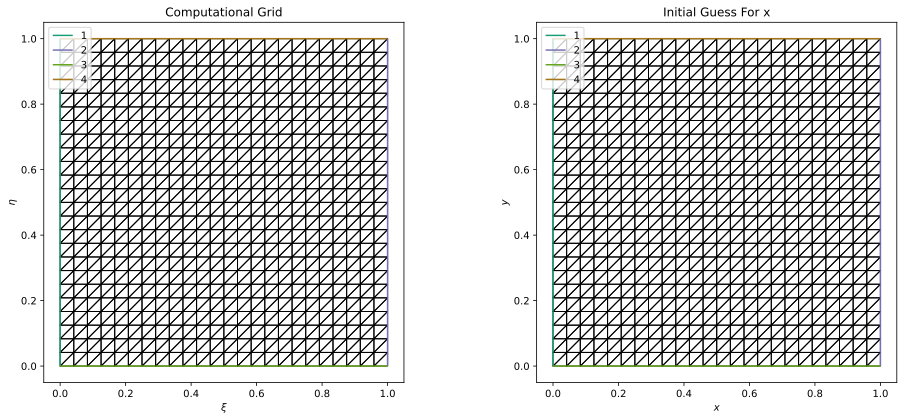

In [ ]:
# Set My Parameters
epsilon = 0.5 # start at 0.2 if uniform!
N = 24
diagonal = "right"
quadrilateral = False
x_choice = 0 # 0 = identity function, 1 = map uniform to shishkin, 2 = map shishkin to uniform
xi_choice = 0 # 0 = uniform mesh, 1 = shishkin mesh
custom_cmap = "GnBu"
deg = 1
MPIter = 10
cont_steps = 25


# Choose mesh density function:

Grad_M = True
Bak_M = False


# SNES stopping criteria
stol = 1e-8
rtol = 1e-8
atol = 1e-50
maxit = 50


# save all progress
all_results = []

# scaling the BI's?
scale_BI = False


# list to save the x's
x_list = []




# Set xi (our starting / background mesh)


if xi_choice == 0: # xi is uniform

  mesh = UnitSquareMesh(N, N, quadrilateral = quadrilateral, diagonal = diagonal)
  xi, eta = SpatialCoordinate(mesh)


if xi_choice == 1: # xi is shishkin

  epsm = 0.025
  beta = 0.99/np.sqrt(2)
  tau_a = 1/2
  tau_b = 2*epsm*(1/beta)*np.log(N)
  tau = min(tau_a, tau_b)

  hB = 2*tau / N
  hI = 2*(1-tau) / N


  part1 = np.arange(0, tau, hB)
  part2 = np.arange(tau, 1.0+hI, hI)

  # w_x = np.concatenate((part1, part2[:-1]))
  # w_y = np.concatenate((part1, part2[:-1]))
  w_x = np.concatenate((part1, part2))
  w_y = np.concatenate((part1, part2))

  mesh = TensorRectangleMesh(w_x, w_y, quadrilateral = quadrilateral, diagonal = diagonal)
  xi, eta = SpatialCoordinate(mesh)




# function spaces

W = VectorFunctionSpace(mesh, "CG", deg) # mesh space
V = FunctionSpace(mesh, "CG", deg) # physical space


# set x (our initial guess for the first mesh solve)


if x_choice == 0: # x is identity function

  x = Function(W).interpolate(as_vector([xi, eta]))

elif x_choice == 1: # x maps uniform to shihskin

  epsx = 0.025
  beta = 0.99/np.sqrt(2)
  tau_a = 1/2
  tau_b = 2*epsx*(1/beta)*np.log(N)
  tau = min(tau_a, tau_b)

  x_shish = conditional( xi < 0.5, 2*xi*tau, tau + 2*(1-tau)*(xi-1/2) )
  y_shish = conditional( eta < 0.5, 2*eta*tau, tau + 2*(1-tau)*(eta-1/2) )

  x = Function(W).interpolate(as_vector([x_shish, y_shish]))


elif x_choice == 2: # x maps shihskin to uniform

  x_shish = conditional( xi <= tau, (1/(2*tau))*xi, (1/(2*(1-tau)))*( xi + 1 - 2*tau) )
  y_shish = conditional( eta < tau, (1/(2*tau))*eta, (1/(2*(1-tau)))*( eta + 1 - 2*tau))

  x = Function(W).interpolate(as_vector([x_shish, y_shish]))


# evaluate our starting x function so that we can visualize

# solution data
old_mesh_vals = mesh.coordinates.dat.data
xsol = np.array(x.at(old_mesh_vals))[:,0]
ysol = np.array(x.at(old_mesh_vals))[:,1]

# create mesh
initial_phys_mesh = UnitSquareMesh(N, N, diagonal  = diagonal, quadrilateral = quadrilateral)
nx = len(xsol)
new_mesh_vals = np.zeros((nx, 2))
new_mesh_vals[:,0] = xsol
new_mesh_vals[:,1] = ysol
initial_phys_mesh.coordinates.dat.data[:] = new_mesh_vals

# plot computational and physical mesh
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# computational grid
xi_plot = triplot(mesh, axes=axes[0])
axes[0].set_title('Computational Grid')
axes[0].set_xlabel(r"$\xi$")
axes[0].set_ylabel(r"$\eta$")
axes[0].set_aspect('equal')
axes[0].legend()

# physical grid
x_plot = triplot(initial_phys_mesh, axes=axes[1])
axes[1].set_title('Initial Guess For x')
axes[1].set_xlabel(r"$x$")
axes[1].set_ylabel(r"$y$")
axes[1].set_aspect('equal')
axes[1].legend()
plt.tight_layout()
plt.show()

print()
print()


#physical error list

physical_l2_e = []
physical_grad_e = []
figures = []
fig_for_later = []

# The Numerical Test

In [ ]:
# Set the epsilon continuation + MP solves



while epsilon >= (1e-3):

# for i in range(cont_steps):


  physical_l2_e.append(epsilon)
  physical_grad_e.append(epsilon)


  print("_"*60 + " epsilon = " + str(epsilon) + " " + "_"*60 )
  print()
  print()
  print()


  # MP Iteration



  try:

    final_x, phys_e1, phys_e2, physical_sol, M_final = MP_iter_woJ(mesh, xi, eta, W, V, x, N, known_solution, MPIter, epsilon,\
                                                                            plot_phys = False, plot_mesh = False,\
                                                                            rtol = rtol, stol = stol, atol = atol, maxit = maxit, Bak_M = Bak_M, Grad_M = Grad_M)
  except Exception as e:

    print()
    print()
    print("FAILED!")
    print(f"MP Iteration failed because: {e}")
    break

  # save errors from physical problem
  physical_l2_e.append(phys_e1)
  physical_grad_e.append(phys_e2)


  # SHADOW MESH TEST

  # create shadow mesh

  shadow = UnitSquareMesh(N,N, quadrilateral = quadrilateral, diagonal = diagonal)

  VOM = VertexOnlyMesh(mesh,vertexcoords=mesh.coordinates.dat.data, redundant=False)
  VOM_V = VectorFunctionSpace(VOM,"DG",0)
  VOM_V_IO = VectorFunctionSpace(VOM.input_ordering,"DG",0)

  test_VOM = Function(VOM_V).interpolate(final_x)
  test_VOM_IO = Function(VOM_V_IO).interpolate(test_VOM)

  shadow.coordinates.dat.data[:] = test_VOM_IO.dat.data[:]


  # now look at u on this mesh

  shadowV = FunctionSpace(shadow, "CG", 1)
  u_shadow = Function(shadowV)
  u_shadow.dat.data[:] = physical_sol.dat.data[:]

  # Lets put the exact solution on this mesh

  sol_known = Function(V).interpolate(known_solution(final_x, epsilon))
  shadow_sol = Function(shadowV)
  shadow_sol.dat.data[:] = sol_known.dat.data[:]


  # their difference

  # sol_diff = Function(W).interpolate(sol_known - physical_sol)
  # shadow_diff = Function(shadowV)
  # shadow_diff.dat.data[:] = sol_diff.dat.data[:]

  # # also put M on this mesh

  # M_shadow1 = Function(shadowV)
  # M_shadow1.dat.data[:] = M_func1.dat.data[:]

  # M_shadow2 = Function(shadowV)
  # M_shadow2.dat.data[:] = M_func2.dat.data[:]


  # plot the results
  fig, axes = plt.subplots(2, 2, figsize=(18, 18))

  u_shadow_array = u_shadow.dat.data
  shadow_sol_array = shadow_sol.dat.data
  sol_known_array = sol_known.dat.data
  physical_sol_array = physical_sol.dat.data

  # sol_diff_array = sol_diff.dat.data
  # shadow_diff_array = shadow_diff.dat.data
  # M_shadow1_array = M_shadow1.dat.data
  # M_func1_array = M_func1.dat.data
  # M_shadow2_array = M_shadow2.dat.data
  # M_func2_array = M_func2.dat.data


  # Calculate common min and max for the first two plots (for colour bar)
  vmin1 = min(np.min(u_shadow_array), np.min(physical_sol_array))
  vmax1 = max(np.max(u_shadow_array), np.max(physical_sol_array))
  # Calculate common min and max for the first two plots (for colour bar)
  vmin4 = min(np.min(shadow_sol_array), np.min(sol_known_array))
  vmax4 = max(np.max(shadow_sol_array), np.max(sol_known_array))


  # Calculate common min and max for the bottom two plots (for colour bar)
  # vmin2 = min(np.min(shadow_diff_array), np.min(sol_diff_array))
  # vmax2 = max(np.max(shadow_diff_array), np.max(sol_diff_array))
  # # Calculate common min and max for the bottom two plots (for colour bar)
  # vmin2 = min(np.min(M_shadow1_array), np.min(M_func1_array))
  # vmax2 = max(np.max(M_shadow1_array), np.max(M_func1_array))
  # # Calculate common min and max for the bottom two plots (for colour bar)
  # vmin3 = min(np.min(M_shadow2_array), np.min(M_func2_array))
  # vmax3 = max(np.max(M_shadow2_array), np.max(M_func2_array))


  # Plot the shadow mesh solution on the first subplot
  c_shad = tricontourf(u_shadow, axes=axes[0,0], cmap = custom_cmap, vmin = vmin1, vmax = vmax1)
  m = triplot(shadow, axes = axes[0,0])
  axes[0,0].set_title('Shadow Mesh Solution for ' + r'$\epsilon$' + ' = ' + "%.8f"%epsilon)
  axes[0,0].set_xlabel(r"$x$")
  axes[0,0].set_ylabel(r"$y$")
  axes[0,0].set_aspect('equal')
  plt.colorbar(c_shad, ax=axes[0,0])
  # Plot the physical solution on the second subplot
  c = tricontourf(physical_sol, axes=axes[0,1], cmap = custom_cmap, vmin = vmin1, vmax = vmax1)
  m = triplot(mesh, axes = axes[0,1])
  axes[0,1].set_title('Approx Physical Solution at ' + r'$\epsilon$' + ' = ' + "%.8f"%epsilon)
  axes[0,1].set_xlabel(r"$\xi$")
  axes[0,1].set_ylabel(r"$\eta$")
  axes[0,1].set_aspect('equal')
  plt.colorbar(c, ax=axes[0,1])

  # Plot the shadow mesh known solution
  c_shad = tricontourf(shadow_sol, axes=axes[1,0], cmap = custom_cmap, vmin = vmin4, vmax = vmax4)
  m = triplot(shadow, axes = axes[1,0])
  axes[1,0].set_title('(Shadow) Known Physical Solution for ' + r'$\epsilon$' + ' = ' + "%.8f"%epsilon)
  axes[1,0].set_xlabel(r"$x$")
  axes[1,0].set_ylabel(r"$y$")
  axes[1,0].set_aspect('equal')
  plt.colorbar(c_shad, ax=axes[1,0])
  # Plot the known solution
  c = tricontourf(sol_known, axes=axes[1,1], cmap = custom_cmap, vmin = vmin4, vmax = vmax4)
  m = triplot(mesh, axes = axes[1,1])
  axes[1,1].set_title('Known Solution at ' + r'$\epsilon$' + ' = ' + "%.8f"%epsilon)
  axes[1,1].set_xlabel(r"$\xi$")
  axes[1,1].set_ylabel(r"$\eta$")
  axes[1,1].set_aspect('equal')
  plt.colorbar(c, ax=axes[1,1])


  # # Plot difference on shadow mesh
  # cm_shad = tricontourf(shadow_diff, axes=axes[2,0], cmap = custom_cmap, vmin = vmin2, vmax = vmax2)
  # m = triplot(shadow, axes = axes[2,0])
  # axes[2,0].set_title('(Shadow) Difference Between Known and Exact Solution for ' + r'$\epsilon$' + ' = ' + "%.8f"%epsilon)
  # axes[2,0].set_xlabel(r"$x$")
  # axes[2,0].set_ylabel(r"$y$")
  # axes[2,0].set_aspect('equal')
  # plt.colorbar(cm_shad, ax=axes[2,0])
  # # diff on mesh
  # cm = tricontourf(sol_diff, axes=axes[2,1], cmap = custom_cmap, vmin = vmin2, vmax = vmax2)
  # m = triplot(mesh, axes = axes[2,1])
  # axes[2,1].set_title('Difference Between Known and Exact Solution for ' + r'$\epsilon$' + ' = ' + "%.8f"%epsilon)
  # axes[2,1].set_xlabel(r"$\xi$")
  # axes[2,1].set_ylabel(r"$\eta$")
  # axes[2,1].set_aspect('equal')
  # plt.colorbar(cm, ax=axes[2,1])

  # # Plot m0 on shadow mesh
  # cm_shad = tricontourf(M_shadow1, axes=axes[2,0], cmap = custom_cmap, vmin = vmin2, vmax = vmax2)
  # m = triplot(shadow, axes = axes[2,0])
  # axes[2,0].set_title('m0 on Shadow Mesh for ' + r'$\epsilon$' + ' = ' + "%.8f"%epsilon)
  # axes[2,0].set_xlabel(r"$x$")
  # axes[2,0].set_ylabel(r"$y$")
  # axes[2,0].set_aspect('equal')
  # plt.colorbar(cm_shad, ax=axes[2,0])
  # # Plot m0 on mesh
  # cm = tricontourf(M_func1, axes=axes[2,1], cmap = custom_cmap, vmin = vmin2, vmax = vmax2)
  # m = triplot(mesh, axes = axes[2,1])
  # axes[2,1].set_title('m0 on Mesh for ' + r'$\epsilon$' + ' = ' + "%.8f"%epsilon)
  # axes[2,1].set_xlabel(r"$\xi$")
  # axes[2,1].set_ylabel(r"$\eta$")
  # axes[2,1].set_aspect('equal')
  # plt.colorbar(cm, ax=axes[2,1])

  # # Plot m1 on shadow mesh
  # cm_shad = tricontourf(M_shadow2, axes=axes[3,0], cmap = custom_cmap, vmin = vmin3, vmax = vmax3)
  # m = triplot(shadow, axes = axes[3,0])
  # axes[3,0].set_title('m1 on Shadow Mesh for ' + r'$\epsilon$' + ' = ' + "%.8f"%epsilon)
  # axes[3,0].set_xlabel(r"$x$")
  # axes[3,0].set_ylabel(r"$y$")
  # axes[3,0].set_aspect('equal')
  # plt.colorbar(cm_shad, ax=axes[3,0])
  # # Plot m1 on mesh
  # cm = tricontourf(M_func2, axes=axes[3,1], cmap = custom_cmap, vmin = vmin3, vmax = vmax3)
  # m = triplot(mesh, axes = axes[3,1])
  # axes[3,1].set_title('m1 on Mesh for ' + r'$\epsilon$' + ' = ' + "%.8f"%epsilon)
  # axes[3,1].set_xlabel(r"$\xi$")
  # axes[3,1].set_ylabel(r"$\eta$")
  # axes[3,1].set_aspect('equal')
  # plt.colorbar(cm, ax=axes[3,1])


  # save the plots
  plt.tight_layout()
  plt.close(fig)
  figures.append(fig)


  epsilon = epsilon*(9/10)
  # updating epsilon

  # if epsilon > (1e-2 + deps2):
  #   epsilon = epsilon - deps1
  # elif epsilon > (1e-3 + deps2):
  #   epsilon = epsilon - deps2


  # updating x as our new initial guess for the next iter

  x.dat.data[:] = final_x.dat.data


____________________________________________________________ epsilon = 0.5 ____________________________________________________________



-----------------------------------------------------------------------------------------------------------------------------
Nonlinear Mesh Solve:
  0 SNES Function norm 2.351177162673e-03
  1 SNES Function norm 4.097911448548e-05
  2 SNES Function norm 1.299416537086e-08
  3 SNES Function norm 3.548778187065e-15
  Nonlinear firedrake_1_ solve converged due to CONVERGED_FNORM_RELATIVE iterations 3
-----------------------------------------------------------------------------------------------------------------------------


-----------------------------------------------------------------------------------------------------------------------------
Nonlinear Mesh Solve:
  0 SNES Function norm 1.953407708986e-05
  1 SNES Function norm 1.507606790444e-09
  2 SNES Function norm 3.564156735696e-15
  Nonlinear firedrake_3_ solve converged due to CONVERGED

# Plot our results

In [ ]:
# display all my figures

# for f in figures:
#   display(f)
#   print()
#   print()
#   print()
#   print()


# only show every 5th plot (so notebook wont crash)

figure_i = 0
while figure_i < (len(figures)-1):

  display(figures[figure_i])
  figure_i = figure_i + 5
  print()
  print()
  print()
  print()

# plot the last figure

display(figures[-1])